# Individual glacier data inspection

This notebook will walk through steps to read in and organize velocity data and clip it to the extent of a single glacier. The tools we will use include **xarray**, **rioxarray**, **geopandas**, and **flox**. 

To clip its_live data to the extent of a single glacier, we will use a vector dataset of glacier outlines, the [Randolph Glacier Inventory](https://nsidc.org/data/nsidc-0770). 

## Learning goals

### Techniques (xarray, python, general)

- Read in raster data using `xarray`
- Read in vector data using `geopandas`
- Manipulate and organize raster data using `xarray` functionality
- Explore larger-than-memory data using `dask` and `xarray`


### High-level science goals:

- Subset large raster dataset to area of interest using vector data
- Examine different types of data stored within a raster object (in this example, the data is in the format of a [zarr datacube](https://zarr.readthedocs.io/en/stable/getting_started.html)
- Handling different coordinate reference systems and projections
- Dataset inspection using:
      - Xarray label- and index-based selection
      - Grouped computations and reductions
      - Visualization tools
  



First, let's install the python libraries that we'll need for this notebook:

In [1]:
%xmode minimal

Exception reporting mode: Minimal


In [2]:
import geopandas as gpd
import os
import numpy as np
import xarray as xr
import rioxarray as rxr
import matplotlib.pyplot as plt
from shapely.geometry import Polygon
from shapely.geometry import MultiPolygon
from shapely.geometry import Point
import cartopy
import json
import urllib.request
import pandas as pd

%config InlineBackend.figure_format='retina'

In [3]:
from dask.distributed import Client, LocalCluster
import psutil
import logging

In [4]:
#cluster = LocalCluster(
#    n_workers = psutil.cpu_count(logical=True)-1, 
#    silence_logs = logging.ERROR, 
#    threads_per_worker=1,
#)
#client = Client(cluster)
#client

## Reading in raster dataset (ITS_LIVE ice velocity data)

We will use some of the functions we defined in the data access notebook in this notebook and others within this tutorial. They are all stored in the `itslivetools.py` file. If you cloned this tutorial from its github [repository](https://github.com/e-marshall/itslive) you'll see that `itslivetools.py` is in the same directory as our current notebook, so we can import it with the following line: 

In [5]:
import itslivetools

First, let's read in the catalog again:  

In [6]:
itslive_catalog = gpd.read_file('https://its-live-data.s3.amazonaws.com/datacubes/catalog_v02.json')

Next, we'll use the `gind_granule_by_point()` and `read_in_s3()` functions to read in the ITS_LIVE zarr datacube as an xarray.Dataset object. 

The `read_in_s3()` function will take a url that points to a zarr data cube stored in an AWS S3 bucket and return an xarray dataset. 

I started with `chunk_size='auto'` which will choose chunk sizes that match the underlying data structure (this is generally ideal). More about choosing good chunk sizes [here](https://blog.dask.org/2021/11/02/choosing-dask-chunk-sizes). If you want to use a different chunk size, specify it when you call the `read_in_s3()` function.

In [7]:
url = itslivetools.find_granule_by_point([95.180191, 30.645973])
url

'http://its-live-data.s3.amazonaws.com/datacubes/v2/N30E090/ITS_LIVE_vel_EPSG32646_G0120_X750000_Y3350000.zarr'

In [8]:
dc = itslivetools.read_in_s3(url)
dc

<xarray.Dataset>
Dimensions:                     (mid_date: 25243, y: 833, x: 833)
Coordinates:
  * mid_date                    (mid_date) datetime64[ns] 2022-06-07T04:21:44...
  * x                           (x) float64 7.001e+05 7.003e+05 ... 8e+05
  * y                           (y) float64 3.4e+06 3.4e+06 ... 3.3e+06 3.3e+06
Data variables: (12/60)
    M11                         (mid_date, y, x) float32 dask.array<chunksize=(25243, 30, 30), meta=np.ndarray>
    M11_dr_to_vr_factor         (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
    M12                         (mid_date, y, x) float32 dask.array<chunksize=(25243, 30, 30), meta=np.ndarray>
    M12_dr_to_vr_factor         (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
    acquisition_date_img1       (mid_date) datetime64[ns] dask.array<chunksize=(25243,), meta=np.ndarray>
    acquisition_date_img2       (mid_date) datetime64[ns] dask.array<chunksize=(25243,), meta=np.ndarray>
    ...                          ...
    vy_error_modeled            (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
    vy_error_slow               (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
    vy_error_stationary         (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
    vy_stable_shift             (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
    vy_stable_shift_slow        (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
    vy_stable_shift_stationary  (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
Attributes: (12/19)
    Conventions:                CF-1.8
    GDAL_AREA_OR_POINT:         Area
    author:                     ITS_LIVE, a NASA MEaSUREs project (its-live.j...
    autoRIFT_parameter_file:    http://its-live-data.s3.amazonaws.com/autorif...
    datacube_software_version:  1.0
    date_created:               25-Sep-2023 22:00:23
    ...                         ...
    s3:                         s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    skipped_granules:           s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    time_standard_img1:         UTC
    time_standard_img2:         UTC
    title:                      ITS_LIVE datacube of image pair velocities
    url:                        https://its-live-data.s3.amazonaws.com/datacu...

### Working with dask

We can see that this is a very large dataset. We have a time dimension with a length of 25,243, and then x and y dimensions that are both 833 units long. There are 60 variables within this dataset that exist along some or all of the dimensions (with the exception of the `mapping` data variable which contains geographic information. If you expand one of the 3-dimensional variables (exists along x,y, and mid_date) you'll see that it is very large (65 GB!). This is more than my computer can handle so we will use [dask](https://www.dask.org/), which is a python package for parallelizing and scaling workflows that let's us work with larger-than-memory data efficiently.

In [9]:
dc.v

<xarray.DataArray 'v' (mid_date: 25243, y: 833, x: 833)>
dask.array<open_dataset-v, shape=(25243, 833, 833), dtype=float32, chunksize=(25243, 30, 30), chunktype=numpy.ndarray>
Coordinates:
  * mid_date  (mid_date) datetime64[ns] 2022-06-07T04:21:44.211208960 ... 201...
  * x         (x) float64 7.001e+05 7.003e+05 7.004e+05 ... 7.999e+05 8e+05
  * y         (y) float64 3.4e+06 3.4e+06 3.4e+06 ... 3.3e+06 3.3e+06 3.3e+06
Attributes:
    description:    velocity magnitude
    grid_mapping:   mapping
    standard_name:  land_ice_surface_velocity
    units:          meter/year

We are reading this in as a dask array. Let's take a look at the chunk sizes:

```{note} 
chunksizes shows the largest chunk size. chunks shows the sizes of all chunks along all dims, better if you have irregular chunks
```

In [10]:
dc.chunksizes

ValueError: Object has inconsistent chunks along dimension y. This can be fixed by calling unify_chunks().

As suggested in the error message, apply the `unify_chunks()` method: 

In [11]:
dc = dc.unify_chunks()

Great, that worked. Now we can see the chunk sizes of the dataset:

In [12]:
dc.chunksizes

Frozen({'mid_date': (25243,), 'y': (30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 23), 'x': (30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 23)})

```{note} 
Setting the dask chunksize to `auto` at the `xr.open_dataset()` step will use chunk sizes that most closely resemble the structure of the underlying data. To avoid imposing a chunk size that isn't a good fit for the data, avoid re-chunking until we have selected a subset of our area of interest from the larger dataset 
```

Check CRS of xr object: 

In [13]:
dc.attrs['projection']

'32646'

Let's take a look at the time dimension (`mid_date` here). To start with we'll just print the first 10 values:

In [14]:
for element in range(10):
    
    print(dc.mid_date[element].data)

2022-06-07T04:21:44.211208960
2018-04-14T04:18:49.171219968
2017-02-10T16:15:50.660901120
2022-04-03T04:19:01.211214080
2021-07-22T04:16:46.210427904
2019-03-15T04:15:44.180925952
2002-09-15T03:59:12.379172096
2002-12-28T03:42:16.181281024
2021-06-29T16:16:10.210323968
2022-03-26T16:18:35.211123968


It doesn't look like the time dimension is in chronological order, let's fix that: 

```{note}
The following cell is commented out because it produces an error and usually leads to a dead kernel. Let's try to troubleshoot this below. 
{add image of error (in screenshots)}

In [15]:
dc_timesorted = dc.sortby(dc['mid_date'])


### Note: work-around for situation where above cell produces error

```{note}
In some test cases, the above cell triggered the following error. While the current version runs fine, I'm including a work around in the following cells in case you encounter this error as well. If you don't, feel free to skip ahead to the next sub-section heading{add image of error (in screenshots)}
```

Let's follow some [internet advice](https://twitter.com/jeremy_mcgibbon/status/1496219098849718274) and try to fix this issue. We will actually start over from the very beginning and read in the dataset using only `xarray` and not `dask`. 

In [16]:
dc_new = xr.open_dataset(url, engine='zarr')

Now we have an `xr.Dataset` that is built on `numpy` arrays rather than `dask` arrays, which means we can re-index along the time dimension using xarray's 'lazy' functionality:

In [17]:
dc_new_timesorted = dc_new.sortby(dc_new['mid_date'])

In [18]:
for element in range(10):
    
    print(dc_new_timesorted.mid_date[element].data)

1986-09-11T03:31:15.003252992
1986-10-05T03:31:06.144750016
1986-10-21T03:31:34.493249984
1986-11-22T03:29:27.023556992
1986-11-30T03:29:08.710132992
1986-12-08T03:29:55.372057024
1986-12-08T03:33:17.095283968
1986-12-16T03:30:10.645544000
1986-12-24T03:29:52.332120960
1987-01-09T03:30:01.787228992


Great, much easier. Now, we will chunk the dataset.

In [19]:
dc_new_timesorted = dc_new_timesorted.chunk()

In [20]:
dc_new_timesorted.chunks

Frozen({'mid_date': (25243,), 'y': (833,), 'x': (833,)})

In [21]:
dc_new_timesorted

<xarray.Dataset>
Dimensions:                     (mid_date: 25243, y: 833, x: 833)
Coordinates:
  * mid_date                    (mid_date) datetime64[ns] 1986-09-11T03:31:15...
  * x                           (x) float64 7.001e+05 7.003e+05 ... 8e+05
  * y                           (y) float64 3.4e+06 3.4e+06 ... 3.3e+06 3.3e+06
Data variables: (12/60)
    M11                         (mid_date, y, x) float32 dask.array<chunksize=(25243, 833, 833), meta=np.ndarray>
    M11_dr_to_vr_factor         (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
    M12                         (mid_date, y, x) float32 dask.array<chunksize=(25243, 833, 833), meta=np.ndarray>
    M12_dr_to_vr_factor         (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
    acquisition_date_img1       (mid_date) datetime64[ns] dask.array<chunksize=(25243,), meta=np.ndarray>
    acquisition_date_img2       (mid_date) datetime64[ns] dask.array<chunksize=(25243,), meta=np.ndarray>
    ...                          ...
    vy_error_modeled            (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
    vy_error_slow               (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
    vy_error_stationary         (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
    vy_stable_shift             (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
    vy_stable_shift_slow        (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
    vy_stable_shift_stationary  (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
Attributes: (12/19)
    Conventions:                CF-1.8
    GDAL_AREA_OR_POINT:         Area
    author:                     ITS_LIVE, a NASA MEaSUREs project (its-live.j...
    autoRIFT_parameter_file:    http://its-live-data.s3.amazonaws.com/autorif...
    datacube_software_version:  1.0
    date_created:               25-Sep-2023 22:00:23
    ...                         ...
    s3:                         s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    skipped_granules:           s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    time_standard_img1:         UTC
    time_standard_img2:         UTC
    title:                      ITS_LIVE datacube of image pair velocities
    url:                        https://its-live-data.s3.amazonaws.com/datacu...

You can see in the above object that while we techincally now have a 'chunked dataset', the entire object is 

In [22]:
chunking_dict = dc.chunksizes
chunking_dict

Frozen({'mid_date': (25243,), 'y': (30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 23), 'x': (30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 23)})

In [23]:
dc_rechunk = dc_new.chunk(chunking_dict)

In [24]:
dc_rechunk.chunks

Frozen({'mid_date': (25243,), 'y': (30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 23), 'x': (30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 23)})

Great, now we have our ITS_LIVE dataset, organized by time and with appropriate chunking. Let's move on and read in vector data describing some physical features we'd like to examine with the ITS_LIVE dataset.

## Incorporating vector data 

Vector data represent discrete features. They contain geometry data as well as attribute data about the features. For a more in-depth description of vector data, read [this](https://datacarpentry.org/organization-geospatial/02-intro-vector-data.html). We will use vector data to focus our analysis on specific glaciers. The dataset we will be usign is called the Randolph Glacier Inventory (RGI). It is a very important dataset for glaciology research; you can read more about it [here](http://www.glims.org/rgi_user_guide/welcome.html).

### Read in vector data

We will read in just one region of the RGI (region 15, SouthAsiaEast). RGI data is downloaded in lat/lon coordinates. We will project it to match the coordinate reference system (CRS) of the ITS_LIVE dataset and then select an individual glacier to begin our analysis. ITS_LIVE data is in the Universal Transverse Mercator (UTM) coordinate system, and each datacube is projected to the UTM zone specific to its location. You can read more about these concepts [here](https://sites.math.washington.edu/~king/coursedir/m445w05/as/projects/Universal%20Transverse%20Mercator%20Geometry3.pdf).

In [25]:
#se_asia = gpd.read_file('https://github.com/e-marshall/itslive/raw/master/rgi15_southasiaeast.geojson')
se_asia = gpd.read_parquet('rgi7_region15_south_asia_east.parquet')

Check the projection of the ITS_LIVE dataset. 

In [26]:
dc.attrs['projection']

'32646'

This means the data is projected to UTM zone 46N.

In [27]:
#project rgi data to match itslive
#we know the epsg from looking at the 'spatial epsg' attr of the mapping var of the dc object
se_asia_prj = se_asia.to_crs(f'EPSG:{dc.attrs["projection"]}') 
se_asia_prj.head(3)

,rgi_id,o1region,o2region,glims_id,anlys_id,subm_id,src_date,cenlon,cenlat,utm_zone,...,zmin_m,zmax_m,zmed_m,zmean_m,slope_deg,aspect_deg,aspect_sec,dem_source,lmax_m,geometry
0,RGI2000-v7.0-G-15-00001,15,15-01,G078088E31398N,866850,752,2002-07-10T00:00:00,78.087891,31.398046,44,...,4662.2950,4699.2095,4669.4720,4671.4253,13.427070,122.267290,4,COPDEM30,173,"POLYGON Z ((-924868.476 3571663.111 0.000, -92..."
1,RGI2000-v7.0-G-15-00002,15,15-01,G078125E31399N,867227,752,2002-07-10T00:00:00,78.123699,31.397796,44,...,4453.3584,4705.9920,4570.9473,4571.2770,22.822983,269.669144,7,COPDEM30,1113,"POLYGON Z ((-921270.161 3571706.471 0.000, -92..."
2,RGI2000-v7.0-G-15-00003,15,15-01,G078128E31390N,867273,752,2000-08-05T00:00:00,78.128510,31.390287,44,...,4791.7593,4858.6807,4832.1836,4827.6700,15.626262,212.719681,6,COPDEM30,327,"POLYGON Z ((-921061.745 3570342.665 0.000, -92..."


In [28]:
len(se_asia_prj)

18587

### Crop RGI to ITS_LIVE extent

Now we have a raster object (the ITS_LIVE dataset) and a vector dataset containing many (18,587!) features, which in this case are individual glacier outlines. We first want to crop the vector dataset by the extent of the raster dataset so that we can look only at the glaciers that are covered by the velocity data. In the first notebook, [accessing_s3_data](/accessing_s3_data.ipynb), we defined a function to create a vector object that describes the footprint of a raster object. Instead of defining it again here we can call it from the `itslivetools` script that we imported at the beginning of this notebook.


In [29]:
#first, get vector bbox of itslive
bbox_dc = itslivetools.get_bounds_polygon(dc)
bbox_dc['geometry']

0    POLYGON ((700132.500 3300067.500, 799972.500 3...
Name: geometry, dtype: geometry

The CRS of the `dc` and `bbox_dc` objects should be the same but its a good idea to check. 

In [30]:
#first check the projection of dc. Notice that it is stored in the attributes of the dc object
dc.attrs['projection']

'32646'

In [31]:
#then check the crs of bbox_dc. Do this by accessing the crs attribute of the bbox_dc object
bbox_dc.crs

<Projected CRS: EPSG:32646>
Name: WGS 84 / UTM zone 46N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 90°E and 96°E, northern hemisphere between equator and 84°N, onshore and offshore. Bangladesh. Bhutan. China. Indonesia. Mongolia. Myanmar (Burma). Russian Federation.
- bounds: (90.0, 0.0, 96.0, 84.0)
Coordinate Operation:
- name: UTM zone 46N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

If they weren't the same, you could use the code that is commented out below to reproject the `bbox_dc` object to match `dc`. 

In [32]:
#project from latlon to local utm 
#bbox_dc = bbox_dc.to_crs(f'EPSG:{dc.attrs["projection"]}')
#bbox_dc

<Axes: >

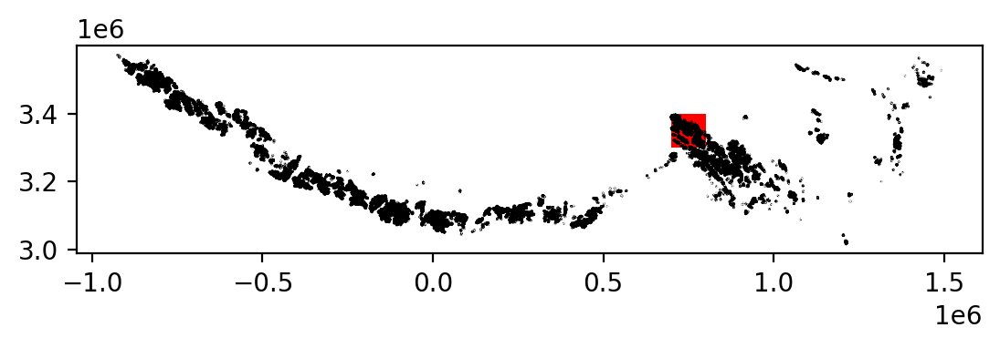

In [33]:
#plot the outline of the itslive granule and the rgi dataframe together
fig, ax = plt.subplots()

bbox_dc.plot(ax=ax, facecolor='None', color='red')
se_asia_prj.plot(ax=ax, facecolor='None')

The plot above shows the coverage of the vector dataset, in black, relative to the extent of the raster dataset, in red. We will use the [geopandas `.clip()`](https://geopandas.org/en/stable/docs/reference/api/geopandas.clip.html) method to subset clip the RGI object (se_asia_prj) by the bbox_dc object which represents the footprint of the raster data cube. 

In [34]:
#subset rgi to bounds 
se_asia_subset = gpd.clip(se_asia_prj, bbox_dc)
se_asia_subset.head()

,rgi_id,o1region,o2region,glims_id,anlys_id,subm_id,src_date,cenlon,cenlat,utm_zone,...,zmin_m,zmax_m,zmed_m,zmean_m,slope_deg,aspect_deg,aspect_sec,dem_source,lmax_m,geometry
16373,RGI2000-v7.0-G-15-16374,15,15-03,G095930E29817N,930178,752,2005-09-08T00:00:00,95.929916,29.817003,46,...,4985.7314,5274.0435,5142.7660,5148.8170,27.024134,139.048110,4,COPDEM30,756,"POLYGON Z ((783110.719 3302487.481 0.000, 7831..."
16374,RGI2000-v7.0-G-15-16375,15,15-03,G095925E29818N,930160,752,2005-09-08T00:00:00,95.925181,29.818399,46,...,4856.2790,5054.9253,4929.5560,4933.6890,44.126980,211.518448,6,COPDEM30,366,"POLYGON Z ((782511.360 3302381.154 0.000, 7825..."
16376,RGI2000-v7.0-G-15-16377,15,15-03,G095915E29820N,930107,752,2005-09-08T00:00:00,95.914583,29.819510,46,...,5072.8910,5150.6196,5108.5020,5111.7217,23.980000,219.341537,6,COPDEM30,170,"POLYGON Z ((781619.822 3302305.074 0.000, 7816..."
16371,RGI2000-v7.0-G-15-16372,15,15-03,G095936E29819N,930215,752,2005-09-08T00:00:00,95.935554,29.819123,46,...,4838.7646,5194.8840,5001.5117,4992.3706,25.684517,128.737870,4,COPDEM30,931,"POLYGON Z ((783420.055 3302493.804 0.000, 7834..."
15879,RGI2000-v7.0-G-15-15880,15,15-03,G095459E29807N,928789,752,1999-07-29T00:00:00,95.459374,29.807181,46,...,3802.1846,4155.1255,4000.2695,4000.4404,28.155806,116.148640,4,COPDEM30,776,"POLYGON Z ((737667.211 3300277.169 0.000, 7377..."


We can use the `geopandas` `.explore()` method to take a look at the RGI dataset:

In [35]:
se_asia_subset.explore()

/home/emmamarshall/miniconda3/envs/itslive_tutorial/lib/python3.11/site-packages/folium/features.py:1102: UserWarning: GeoJsonTooltip is not configured to render for GeoJson GeometryCollection geometries. Please consider reworking these features: [{'rgi_id': 'RGI2000-v7.0-G-15-16433', 'o1region': '15', 'o2region': '15-03', 'glims_id': 'G095721E29941N', 'anlys_id': 929520, 'subm_id': 752, 'src_date': '2005-09-08T00:00:00', 'cenlon': 95.7211016152286, 'cenlat': 29.940902187781784, 'utm_zone': 46, 'area_km2': 0.340954350813452, 'primeclass': 0, 'conn_lvl': 0, 'surge_type': 0, 'term_type': 9, 'glac_name': None, 'is_rgi6': 0, 'termlon': 95.72222864596793, 'termlat': 29.937137080413784, 'zmin_m': 4657.792, 'zmax_m': 5049.5625, 'zmed_m': 4825.1104, 'zmean_m': 4839.4185, 'slope_deg': 23.704372, 'aspect_deg': 145.20973, 'aspect_sec': 4, 'dem_source': 'COPDEM30', 'lmax_m': 891}, {'rgi_id': 'RGI2000-v7.0-G-15-12194', 'o1region': '15', 'o2region': '15-03', 'glims_id': 'G095869E30315N', 'anlys_id':

### Handling different geometry types

Oops, it looks like we're getting a warning on the `explore()` method. It looks like this is interfering with the functionality that displays feature info when you hover over a feature. Let's dig into it and see what's going on. It looks like the issue is being caused by rows of the `GeoDataFrame` object that have a 'GeometryCollection' geometry type. First, I'm going to copy the warning into a cell below. The warning is already in the form of a list of dictionaries, which makes it nice to work with:

Here is the error message separated from the problem geometries: 

/home/../python3.11/site-packages/folium/features.py:1102: UserWarning: GeoJsonTooltip is not configured to render for GeoJson GeometryCollection geometries. Please consider reworking these features: ..... to MultiPolygon for full functionality.

And below are the problem geometries identified in the error message saved as a list of dictionaries:

In [36]:
problem_geoms = [{'rgi_id': 'RGI2000-v7.0-G-15-16433', 'o1region': '15', 'o2region': '15-03', 'glims_id': 'G095721E29941N', 'anlys_id': 929520, 'subm_id': 752, 'src_date': '2005-09-08T00:00:00', 'cenlon': 95.7211016152286, 'cenlat': 29.940902187781784, 'utm_zone': 46, 'area_km2': 0.340954350813452, 'primeclass': 0, 'conn_lvl': 0, 'surge_type': 0, 'term_type': 9, 'glac_name': None, 'is_rgi6': 0, 'termlon': 95.72222864596793, 'termlat': 29.937137080413784, 'zmin_m': 4657.792, 'zmax_m': 5049.5625, 'zmed_m': 4825.1104, 'zmean_m': 4839.4185, 'slope_deg': 23.704372, 'aspect_deg': 145.20973, 'aspect_sec': 4, 'dem_source': 'COPDEM30', 'lmax_m': 891}, 
                 {'rgi_id': 'RGI2000-v7.0-G-15-12194', 'o1region': '15', 'o2region': '15-03', 'glims_id': 'G095869E30315N', 'anlys_id': 929951, 'subm_id': 752, 'src_date': '2005-09-08T00:00:00', 'cenlon': 95.86889789565677, 'cenlat': 30.3147685, 'utm_zone': 46, 'area_km2': 8.797406997273084, 'primeclass': 0, 'conn_lvl': 0, 'surge_type': 0, 'term_type': 9, 'glac_name': None, 'is_rgi6': 0, 'termlon': 95.89518363763428, 'termlat': 30.307036248571297, 'zmin_m': 4642.1445, 'zmax_m': 5278.752, 'zmed_m': 5011.06, 'zmean_m': 4993.9243, 'slope_deg': 12.372513, 'aspect_deg': 81.418945, 'aspect_sec': 3, 'dem_source': 'COPDEM30', 'lmax_m': 4994},
                 {'rgi_id': 'RGI2000-v7.0-G-15-11941', 'o1region': '15', 'o2region': '15-03', 'glims_id': 'G095301E30377N', 'anlys_id': 928228, 'subm_id': 752, 'src_date': '2007-08-20T00:00:00', 'cenlon': 95.30071978915663, 'cenlat': 30.3770025, 'utm_zone': 46, 'area_km2': 0.267701958906151, 'primeclass': 0, 'conn_lvl': 0, 'surge_type': 0, 'term_type': 9, 'glac_name': None, 'is_rgi6': 0, 'termlon': 95.30345982475616, 'termlat': 30.380097687364806, 'zmin_m': 5475.784, 'zmax_m': 5977.979, 'zmed_m': 5750.727, 'zmean_m': 5759.621, 'slope_deg': 41.069595, 'aspect_deg': 350.3331518173218, 'aspect_sec': 1, 'dem_source': 'COPDEM30', 'lmax_m': 807}] 

First, I'll convert the `problem_geoms` object from a list of dictionary objects to a `pandas.DataFrame` object

In [37]:
problem_geoms_df = pd.DataFrame(data=problem_geoms)

Then make a list of the IDs of the glaciers in this dataframe:

In [38]:
problem_geom_ids = problem_geoms_df['glims_id'].to_list()

In [39]:
problem_geom_ids

['G095721E29941N', 'G095869E30315N', 'G095301E30377N']

We'll make a `geopandas.GeoDataFrame` object that is just the above-identified outlines:

In [40]:
problem_geoms_gdf = se_asia_subset.loc[se_asia_subset['glims_id'].isin(problem_geom_ids)]

Now, let's check the geometry-type of these outlines and compare them to another outline from the `se_asia_subset` object that wasn't flagged:

In [41]:
problem_geoms_gdf.loc[problem_geoms_gdf['glims_id'] == 'G095301E30377N'].geom_type

11940    GeometryCollection
dtype: object

In [42]:
se_asia_subset.loc[se_asia_subset['rgi_id'] == 'RGI2000-v7.0-G-15-11754'].geom_type

11753    Polygon
dtype: object

Now the warning from calling `geopandas.GeoDataFrame.explore()` makes more sense. Most features in `se_asia_subset` have `geom_type = Polygon` but the flagged features have `geom_type= GeometryCollection`. Let's dig a bit more into these flagged geometries. To do this, we can use the [geopandas method `explode()`](https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.explode.html) to split multiple geometries into multiple single geometries.

In [43]:
first_flagged_feature = problem_geoms_gdf[problem_geoms_gdf.glims_id == 'G095301E30377N'].geometry.explode(index_parts=True)

Printing this object shows that it actually contains a polygon geometry and a linestring geometry:

In [44]:
first_flagged_feature

11940  0    POLYGON Z ((721543.154 3362894.920 0.000, 7215...
       1    LINESTRING Z (721119.337 3362535.315 0.000, 72...
Name: geometry, dtype: geometry

Let's look at the other two: 

In [45]:
second_flagged_feature = problem_geoms_gdf[problem_geoms_gdf.glims_id == 'G095869E30315N'].geometry.explode(index_parts=True)
second_flagged_feature

12193  0    POLYGON Z ((774975.604 3356334.670 0.000, 7749...
       1    LINESTRING Z (776713.643 3359150.691 0.000, 77...
Name: geometry, dtype: geometry

In [46]:
third_flagged_feature = problem_geoms_gdf[problem_geoms_gdf.glims_id == 'G095721E29941N'].geometry.explode(index_parts=True)
third_flagged_feature

16432  0    POLYGON Z ((762550.755 3315675.227 0.000, 7625...
       1    LINESTRING Z (762974.041 3315372.040 0.000, 76...
Name: geometry, dtype: geometry

Let's look at some properties of the line geometry objects like length:

In [47]:
print(third_flagged_feature[1:].length.iloc[0])
print(second_flagged_feature[1:].length.iloc[0])
print(third_flagged_feature[1:].length.iloc[0])

0.07253059141477144
0.07953751551272183
0.07253059141477144


It looks like all of the linestring objects are very small, possibly artifacts, and don't need to remain in the dataset. For simplicity, we can remove them from the original object. There are different ways to do this, but here's one approach:

1. Identify and remove all features with the `GeometryCollection` geom_type:

In [48]:
se_asia_subset_polygon = se_asia_subset[~se_asia_subset['geometry'].apply(lambda x : x.geom_type=='GeometryCollection' )]

2. Remove the line geometries from the `GeometryCollection` features:

In [49]:
se_asia_subset_geom_collection = se_asia_subset[se_asia_subset['geometry'].apply(lambda x : x.geom_type=='GeometryCollection' )]

3. Make an object that is just the features where `geom_type` = Polygon:

In [50]:
keep_polygons = se_asia_subset_geom_collection.explode(index_parts=True).loc[se_asia_subset_geom_collection.explode(index_parts=True).geom_type == 'Polygon']

4. Append the polygons to the `se_asia_subset_polygons` object:

In [51]:
se_asia_polygons = pd.concat([se_asia_subset_polygon,keep_polygons])

As a sanity check, let's make sure that we didn't lose any glacier outline features during all of that:

In [52]:
len(se_asia_subset['rgi_id']) == len(se_asia_polygons)

True

Great, we know that we have the same number of glaciers that we started with. 

Now, let's try visualizing the outlines with `explore()` again and seeing if the hover tools work:

In [53]:
se_asia_polygons.explore()

We can use the above interactive map to select a glacier to look at in more detail below.

### Select a single glacier

We'll choose a single glacier to work with for now:

In [54]:
sample_glacier_vec = se_asia_subset.loc[se_asia_subset['rgi_id'] == 'RGI2000-v7.0-G-15-16257']
sample_glacier_vec

,rgi_id,o1region,o2region,glims_id,anlys_id,subm_id,src_date,cenlon,cenlat,utm_zone,...,zmin_m,zmax_m,zmed_m,zmean_m,slope_deg,aspect_deg,aspect_sec,dem_source,lmax_m,geometry
16256,RGI2000-v7.0-G-15-16257,15,15-03,G095962E29920N,930314,752,2005-09-08T00:00:00,95.961972,29.920094,46,...,4320.7065,5937.84,5179.605,5131.8877,22.803406,100.811325,3,COPDEM30,5958,"POLYGON Z ((788176.951 3315860.842 0.000, 7882..."


### Clip ITS_LIVE dataset to individual glacier extent

First, we need to use `rio.write_crs()` to assign a CRS to the itslive object. If we don't do that first the `rio.clip()` command will produce an error


*Note*: you can only run write_crs() once, because it switches mapping from being a `data_var` to a `coord` so if you run it again it will produce a key error looking for a var that doesnt' exist

In [55]:
dc = dc.rio.write_crs(f"epsg:{dc.attrs['projection']}", inplace=True)

In [56]:
%%time

sample_glacier_raster = dc.rio.clip(sample_glacier_vec.geometry, sample_glacier_vec.crs)

CPU times: user 242 ms, sys: 482 µs, total: 242 ms
Wall time: 250 ms


## Working with clipped raster velocity data

In [57]:
sample_glacier_raster

<xarray.Dataset>
Dimensions:                     (mid_date: 25243, x: 40, y: 37)
Coordinates:
  * mid_date                    (mid_date) datetime64[ns] 2022-06-07T04:21:44...
  * x                           (x) float64 7.843e+05 7.844e+05 ... 7.889e+05
  * y                           (y) float64 3.316e+06 3.316e+06 ... 3.311e+06
    mapping                     int64 0
Data variables: (12/59)
    M11                         (mid_date, y, x) float32 dask.array<chunksize=(25243, 19, 19), meta=np.ndarray>
    M11_dr_to_vr_factor         (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
    M12                         (mid_date, y, x) float32 dask.array<chunksize=(25243, 19, 19), meta=np.ndarray>
    M12_dr_to_vr_factor         (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
    acquisition_date_img1       (mid_date) datetime64[ns] dask.array<chunksize=(25243,), meta=np.ndarray>
    acquisition_date_img2       (mid_date) datetime64[ns] dask.array<chunksize=(25243,), meta=np.ndarray>
    ...                          ...
    vy_error_modeled            (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
    vy_error_slow               (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
    vy_error_stationary         (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
    vy_stable_shift             (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
    vy_stable_shift_slow        (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
    vy_stable_shift_stationary  (mid_date) float32 dask.array<chunksize=(25243,), meta=np.ndarray>
Attributes: (12/19)
    Conventions:                CF-1.8
    GDAL_AREA_OR_POINT:         Area
    author:                     ITS_LIVE, a NASA MEaSUREs project (its-live.j...
    autoRIFT_parameter_file:    http://its-live-data.s3.amazonaws.com/autorif...
    datacube_software_version:  1.0
    date_created:               25-Sep-2023 22:00:23
    ...                         ...
    s3:                         s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    skipped_granules:           s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    time_standard_img1:         UTC
    time_standard_img2:         UTC
    title:                      ITS_LIVE datacube of image pair velocities
    url:                        https://its-live-data.s3.amazonaws.com/datacu...

Take a look at the clipped object:

In [58]:
sample_glacier_raster.mid_date

<xarray.DataArray 'mid_date' (mid_date: 25243)>
array(['2022-06-07T04:21:44.211208960', '2018-04-14T04:18:49.171219968',
       '2017-02-10T16:15:50.660901120', ..., '2013-05-20T04:08:31.155972096',
       '2015-10-17T04:11:05.527512064', '2015-11-10T04:11:15.457366016'],
      dtype='datetime64[ns]')
Coordinates:
  * mid_date  (mid_date) datetime64[ns] 2022-06-07T04:21:44.211208960 ... 201...
    mapping   int64 0
Attributes:
    description:    midpoint of image 1 and image 2 acquisition date and time...
    standard_name:  image_pair_center_date_with_time_separation

We will work with a 4-year subset of the time series.

In [59]:
sample_glacier_raster = sample_glacier_raster.where(sample_glacier_raster.mid_date.dt.year > 2016, drop=True)


In [60]:
sample_glacier_raster = sample_glacier_raster.where(sample_glacier_raster.mid_date.dt.year < 2020, drop=True)

What satellite sensors are represented in this time series subset?

In [61]:
set(sample_glacier_raster.satellite_img1.values)

{'1A', '2A', '2B', '7', '8'}

Next we want to perform some computations that require us to load this object into memory. To do this we will use the [dask .compute()](https://docs.dask.org/en/stable/generated/dask.dataframe.DataFrame.compute.html) method, which turns a 'lazy' object into an in-memory object. If you try to run compute on too large of an object, your computer may run out of RAM and the kernel being used in this python session will die (if this happens, click 'restart kernel' from the kernel drop down menu above).  

In [62]:
sample_glacier_raster = sample_glacier_raster.compute()

In [63]:
sample_glacier_raster

<xarray.Dataset>
Dimensions:                     (mid_date: 3974, y: 37, x: 40)
Coordinates:
  * mid_date                    (mid_date) datetime64[ns] 2018-04-14T04:18:49...
  * x                           (x) float64 7.843e+05 7.844e+05 ... 7.889e+05
  * y                           (y) float64 3.316e+06 3.316e+06 ... 3.311e+06
    mapping                     int64 0
Data variables: (12/59)
    M11                         (mid_date, y, x) float32 nan nan nan ... nan nan
    M11_dr_to_vr_factor         (mid_date) float32 nan nan nan ... nan nan nan
    M12                         (mid_date, y, x) float32 nan nan nan ... nan nan
    M12_dr_to_vr_factor         (mid_date) float32 nan nan nan ... nan nan nan
    acquisition_date_img1       (mid_date) datetime64[ns] 2017-12-20T04:21:49...
    acquisition_date_img2       (mid_date) datetime64[ns] 2018-08-07T04:15:49...
    ...                          ...
    vy_error_modeled            (mid_date) float32 40.5 28.6 27.4 ... 97.0 166.2
    vy_error_slow               (mid_date) float32 8.0 1.7 1.2 ... 9.7 11.3 25.4
    vy_error_stationary         (mid_date) float32 8.0 1.7 1.2 ... 9.7 11.3 25.4
    vy_stable_shift             (mid_date) float32 8.9 -4.9 -0.7 ... -3.6 -10.8
    vy_stable_shift_slow        (mid_date) float32 8.9 -4.9 -0.7 ... -3.6 -10.7
    vy_stable_shift_stationary  (mid_date) float32 8.9 -4.9 -0.7 ... -3.6 -10.8
Attributes: (12/19)
    Conventions:                CF-1.8
    GDAL_AREA_OR_POINT:         Area
    author:                     ITS_LIVE, a NASA MEaSUREs project (its-live.j...
    autoRIFT_parameter_file:    http://its-live-data.s3.amazonaws.com/autorif...
    datacube_software_version:  1.0
    date_created:               25-Sep-2023 22:00:23
    ...                         ...
    s3:                         s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    skipped_granules:           s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    time_standard_img1:         UTC
    time_standard_img2:         UTC
    title:                      ITS_LIVE datacube of image pair velocities
    url:                        https://its-live-data.s3.amazonaws.com/datacu...

### Visualizing data

You can plot the velocity data (a raster object, type = `xr.Dataset`) and the glacier outline (a vector object, type=`gpd.GeoDataFrame`) on top of one another in the same figure.


#### A simple reduction
To start with and for the sake of easy visualizing we will take the mean of the magnitude of velocity variable along the `mid_date` dimension:

In [64]:
sample_glacier_raster_timemean = sample_glacier_raster.mean(dim='mid_date')

In [65]:
sample_glacier_raster_timemean #now object is 2d

<xarray.Dataset>
Dimensions:                     (y: 37, x: 40)
Coordinates:
  * x                           (x) float64 7.843e+05 7.844e+05 ... 7.889e+05
  * y                           (y) float64 3.316e+06 3.316e+06 ... 3.311e+06
    mapping                     int64 0
Data variables: (12/48)
    M11                         (y, x) float32 nan nan nan nan ... nan nan nan
    M11_dr_to_vr_factor         float32 nan
    M12                         (y, x) float32 nan nan nan nan ... nan nan nan
    M12_dr_to_vr_factor         float32 nan
    chip_size_height            (y, x) float32 nan nan nan nan ... nan nan nan
    chip_size_width             (y, x) float32 nan nan nan nan ... nan nan nan
    ...                          ...
    vy_error_modeled            float32 108.3
    vy_error_slow               float32 14.55
    vy_error_stationary         float32 14.55
    vy_stable_shift             float32 0.6379
    vy_stable_shift_slow        float32 0.6373
    vy_stable_shift_stationary  float32 0.6379

```{note}
To avoid propagating noise in the dataset, one can first perform the reduction (mean along time dimension), and then calculate the magnitude of velocity off of the reduced x and y-components of velocity
```

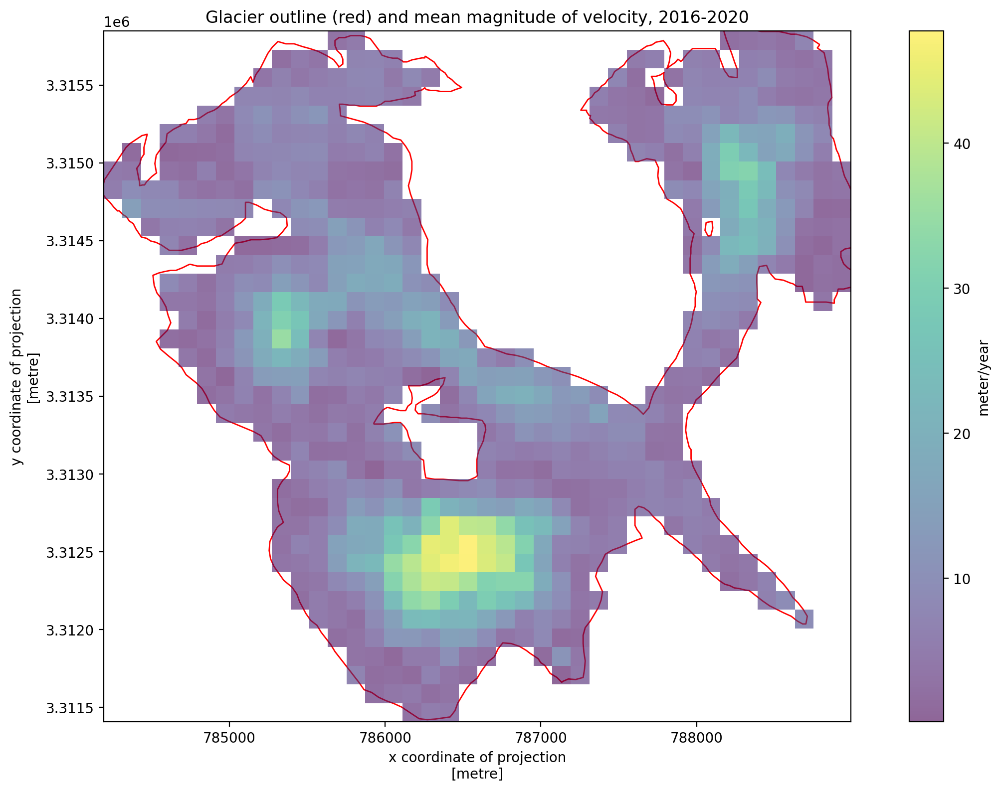

In [66]:
fig, ax = plt.subplots(figsize=(15,9))

sample_glacier_vec.plot(ax=ax, facecolor='none', edgecolor='red')
a = np.sqrt(sample_glacier_raster_timemean.vx**2 + sample_glacier_raster_timemean.vy**2).plot(ax=ax, alpha=0.6)
a.colorbar.set_label('meter/year')
ax.set_title('Glacier outline (red) and mean magnitude of velocity, 2016-2020');

Now let's take a look at the x and y components of velocity, again averaging over time:

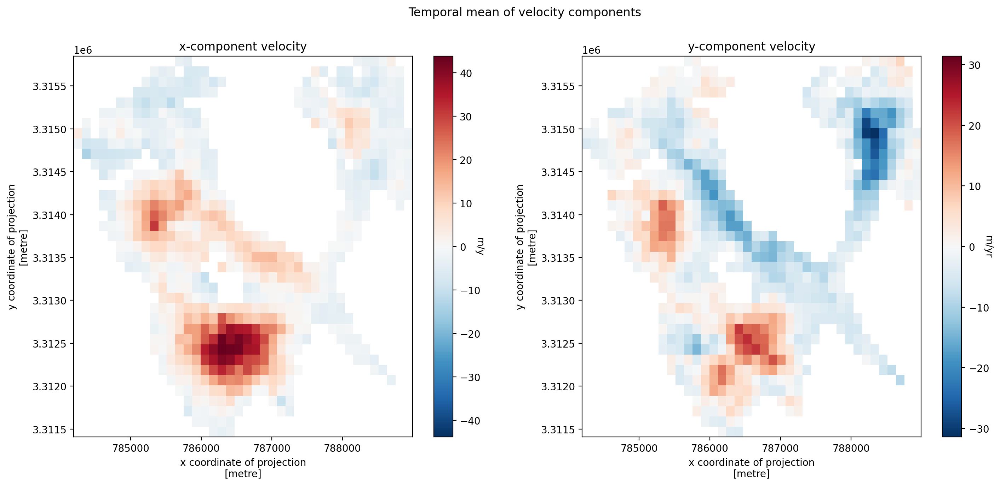

In [67]:
fig, axs = plt.subplots(ncols =2, figsize=(17,7))

x = sample_glacier_raster.vx.mean(dim='mid_date').plot(ax=axs[0])
y = sample_glacier_raster.vy.mean(dim='mid_date').plot(ax=axs[1])
axs[0].set_title('x-component velocity')
axs[1].set_title('y-component velocity')
fig.suptitle('Temporal mean of velocity components')

x.colorbar.set_label('m/y', rotation=270)
y.colorbar.set_label('m/yr', rotation=270);

We can also plot the estimated error associated with the magnitude of velocity variable, which is included in the dataset

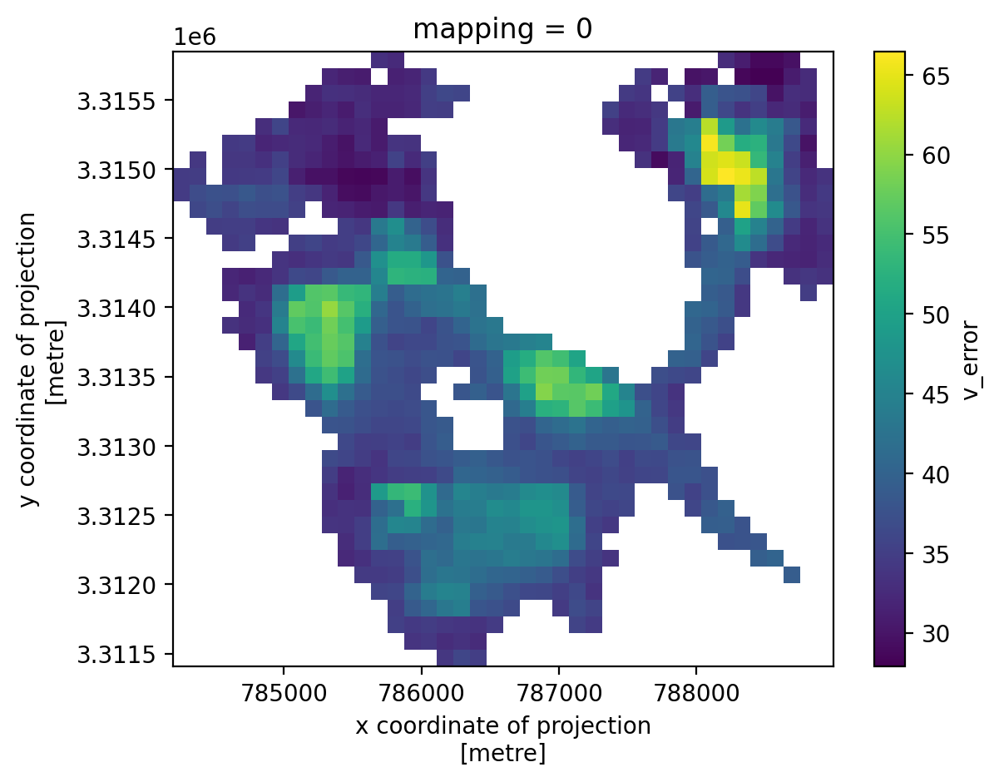

In [68]:
sample_glacier_raster.v_error.mean(dim=['mid_date']).plot();

`v_error` is large relative to the velocity vectors, suggesting that this data could be pretty noisy. 

Next we will visualize the velocity vectors.

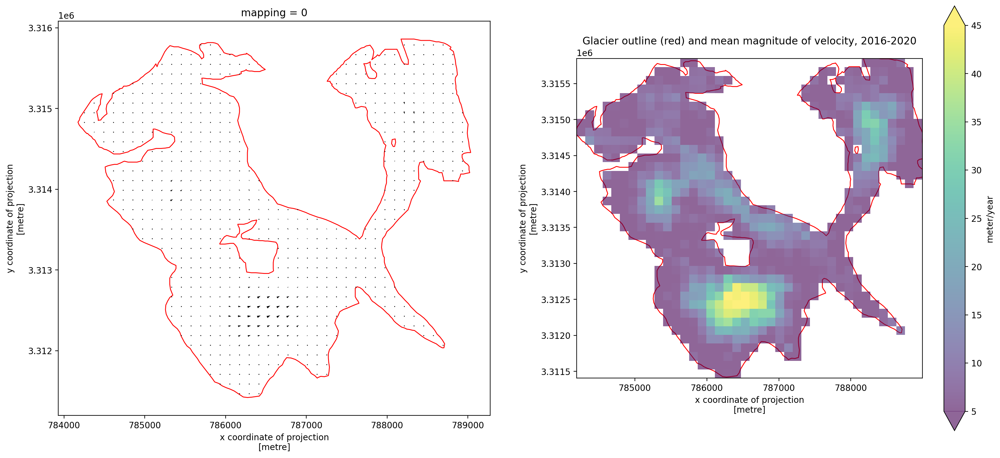

In [69]:
fig, (ax,ax1)= plt.subplots(ncols=2, figsize=(20,9))

sample_glacier_vec.plot(ax=ax, facecolor='none', edgecolor='red')
sample_glacier_raster_timemean.plot.quiver('x','y','vx','vy', ax=ax, angles='xy', vmax=45, vmin=5, scale_units='xy', scale=1)

sample_glacier_vec.plot(ax=ax1, facecolor='none', edgecolor='red')
a = np.sqrt(sample_glacier_raster_timemean.vx**2 + sample_glacier_raster_timemean.vy**2).plot(ax=ax1, alpha=0.6, vmax=45, vmin=5)
a.colorbar.set_label('meter/year')
ax1.set_title('Glacier outline (red) and mean magnitude of velocity, 2016-2020');

In this quiver plot, the units scale is set so that the horizontal and vertical components of velocity have the same units as the x and y dimensions (meters). This obscures a lot of the variability so  we will replot the vectors letting the length be scaled based on average vector length

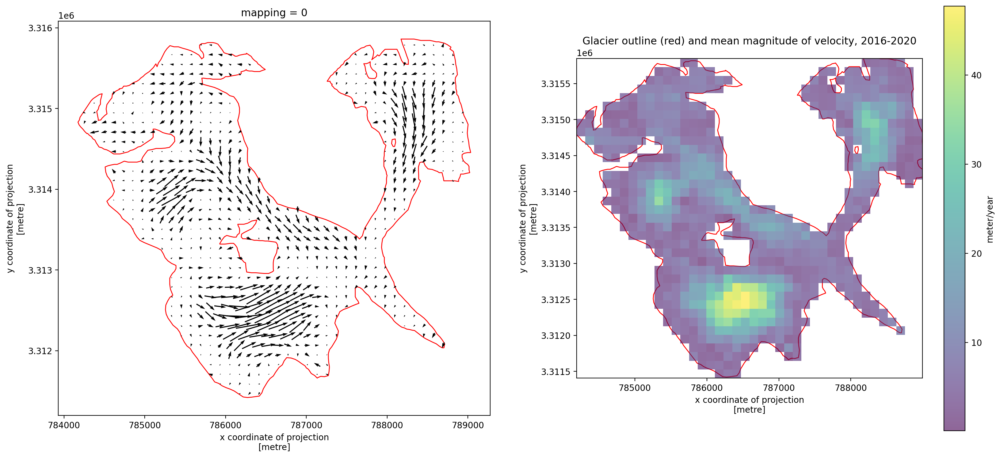

In [70]:
fig, (ax,ax1)= plt.subplots(ncols=2, figsize=(20,9))

sample_glacier_vec.plot(ax=ax, facecolor='none', edgecolor='red')
sample_glacier_raster_timemean.plot.quiver('x','y','vx','vy', ax=ax, angles='xy', vmax=45, vmin=5)

sample_glacier_vec.plot(ax=ax1, facecolor='none', edgecolor='red')
a = np.sqrt(sample_glacier_raster_timemean.vx**2 + sample_glacier_raster_timemean.vy**2).plot(ax=ax1, alpha=0.6)#, vmax=45, vmin=5)
a.colorbar.set_label('meter/year')
ax1.set_title('Glacier outline (red) and mean magnitude of velocity, 2016-2020');

Now we can see more of the variability that aligns better with the calculated magnitude of velocity.

## Exploring ITS_LIVE data

ITS_LIVE data cubes come with many variables that carry information about the estimated surface velocities and the satellite images that were used to generate the surface velocity estimates. We won't examine all of this information here but let's look at a litte bit.

To start with, let's look at the satellite imagery used to generate the velocity data.

We see that we have two `data_vars` that indicate which sensor that each image in the image pair at a certain time step comes from. 

In [71]:
sample_glacier_raster.satellite_img2

<xarray.DataArray 'satellite_img2' (mid_date: 3974)>
array(['2B', '2B', '2B', ..., '8', '8', '7'], dtype=object)
Coordinates:
  * mid_date  (mid_date) datetime64[ns] 2018-04-14T04:18:49.171219968 ... 201...
    mapping   int64 0
Attributes:
    description:    id of the satellite that acquired image 2
    standard_name:  image2_satellite

The `satellite_img1` and `satellite_img2` variables are 1-dimensional numpy arrays corresponding to the length of the `mid_date` dimension of the data cube. You can see that each element of the array is a string corresponding to a different satellite:
    `1A` = Sentinel 1A, `1B` = Sentinel 1B, `2A` = Sentinel 2A
    `2B` = Sentinel 2B, `7` = Landsat7, `8` = Landsat8  


## Examining velocity data from each satellite in `ITS_LIVE` dataset

What if we only wanted to look at the velocity estimates from Landsat8?

In [72]:
l8_data = sample_glacier_raster.where(sample_glacier_raster['satellite_img1'] == '8', drop=True)
l8_data

<xarray.Dataset>
Dimensions:                     (mid_date: 662, y: 37, x: 40)
Coordinates:
  * mid_date                    (mid_date) datetime64[ns] 2017-12-25T04:11:40...
  * x                           (x) float64 7.843e+05 7.844e+05 ... 7.889e+05
  * y                           (y) float64 3.316e+06 3.316e+06 ... 3.311e+06
    mapping                     int64 0
Data variables: (12/59)
    M11                         (mid_date, y, x) float32 nan nan nan ... nan nan
    M11_dr_to_vr_factor         (mid_date) float32 nan nan nan ... nan nan nan
    M12                         (mid_date, y, x) float32 nan nan nan ... nan nan
    M12_dr_to_vr_factor         (mid_date) float32 nan nan nan ... nan nan nan
    acquisition_date_img1       (mid_date) datetime64[ns] 2017-12-21T04:10:40...
    acquisition_date_img2       (mid_date) datetime64[ns] 2017-12-29T04:12:40...
    ...                          ...
    vy_error_modeled            (mid_date) float32 1.163e+03 232.7 ... 166.2
    vy_error_slow               (mid_date) float32 112.5 37.6 54.1 ... 11.3 25.4
    vy_error_stationary         (mid_date) float32 112.5 37.6 54.2 ... 11.3 25.4
    vy_stable_shift             (mid_date) float32 -74.2 -25.7 ... -3.6 -10.8
    vy_stable_shift_slow        (mid_date) float32 -73.8 -25.7 ... -3.6 -10.7
    vy_stable_shift_stationary  (mid_date) float32 -74.2 -25.7 ... -3.6 -10.8
Attributes: (12/19)
    Conventions:                CF-1.8
    GDAL_AREA_OR_POINT:         Area
    author:                     ITS_LIVE, a NASA MEaSUREs project (its-live.j...
    autoRIFT_parameter_file:    http://its-live-data.s3.amazonaws.com/autorif...
    datacube_software_version:  1.0
    date_created:               25-Sep-2023 22:00:23
    ...                         ...
    s3:                         s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    skipped_granules:           s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    time_standard_img1:         UTC
    time_standard_img2:         UTC
    title:                      ITS_LIVE datacube of image pair velocities
    url:                        https://its-live-data.s3.amazonaws.com/datacu...

`dataset.where()` at first seems appropriate to use for kind of operation but there's actually an easier way. Because we are selecting along a single dimension (`mid_date`), we can use xarray's `.sel()` method instead. This is more efficient and integrates with `dask` arrays more smoothly.

In [73]:
l8_condition = sample_glacier_raster.satellite_img1 == '8'
l8_subset = sample_glacier_raster.sel(mid_date=l8_condition)
l8_subset

<xarray.Dataset>
Dimensions:                     (mid_date: 662, y: 37, x: 40)
Coordinates:
  * mid_date                    (mid_date) datetime64[ns] 2017-12-25T04:11:40...
  * x                           (x) float64 7.843e+05 7.844e+05 ... 7.889e+05
  * y                           (y) float64 3.316e+06 3.316e+06 ... 3.311e+06
    mapping                     int64 0
Data variables: (12/59)
    M11                         (mid_date, y, x) float32 nan nan nan ... nan nan
    M11_dr_to_vr_factor         (mid_date) float32 nan nan nan ... nan nan nan
    M12                         (mid_date, y, x) float32 nan nan nan ... nan nan
    M12_dr_to_vr_factor         (mid_date) float32 nan nan nan ... nan nan nan
    acquisition_date_img1       (mid_date) datetime64[ns] 2017-12-21T04:10:40...
    acquisition_date_img2       (mid_date) datetime64[ns] 2017-12-29T04:12:40...
    ...                          ...
    vy_error_modeled            (mid_date) float32 1.163e+03 232.7 ... 166.2
    vy_error_slow               (mid_date) float32 112.5 37.6 54.1 ... 11.3 25.4
    vy_error_stationary         (mid_date) float32 112.5 37.6 54.2 ... 11.3 25.4
    vy_stable_shift             (mid_date) float32 -74.2 -25.7 ... -3.6 -10.8
    vy_stable_shift_slow        (mid_date) float32 -73.8 -25.7 ... -3.6 -10.7
    vy_stable_shift_stationary  (mid_date) float32 -74.2 -25.7 ... -3.6 -10.8
Attributes: (12/19)
    Conventions:                CF-1.8
    GDAL_AREA_OR_POINT:         Area
    author:                     ITS_LIVE, a NASA MEaSUREs project (its-live.j...
    autoRIFT_parameter_file:    http://its-live-data.s3.amazonaws.com/autorif...
    datacube_software_version:  1.0
    date_created:               25-Sep-2023 22:00:23
    ...                         ...
    s3:                         s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    skipped_granules:           s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    time_standard_img1:         UTC
    time_standard_img2:         UTC
    title:                      ITS_LIVE datacube of image pair velocities
    url:                        https://its-live-data.s3.amazonaws.com/datacu...

Let's take a look at the average speeds of the Landsat8-derived velocities:

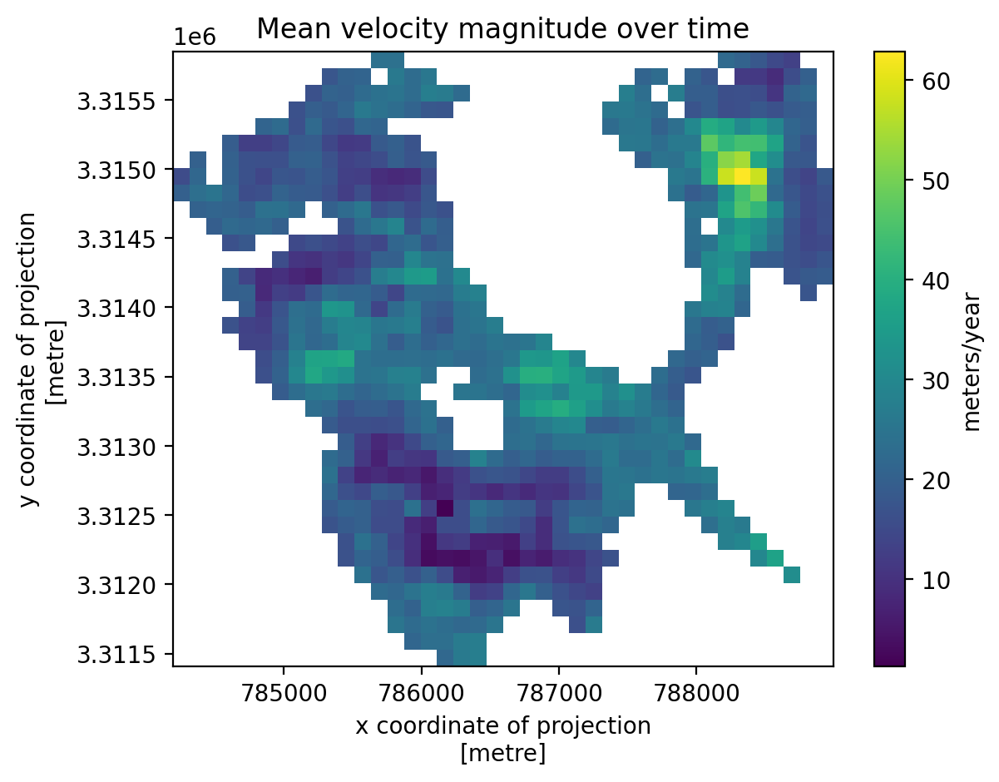

In [74]:
fig, ax = plt.subplots()
l8_mean = np.sqrt(l8_subset.vx.mean(dim='mid_date')**2 + (l8_subset.vy.mean(dim='mid_date')**2))
a = l8_mean.plot(ax=ax)
a.colorbar.set_label('meters/year')
ax.set_title('Mean velocity magnitude over time');

What about Landsat7?

In [75]:
l7_condition = sample_glacier_raster.satellite_img1 == '7'

l7_subset = sample_glacier_raster.sel(mid_date=l7_condition)
l7_subset

<xarray.Dataset>
Dimensions:                     (mid_date: 803, y: 37, x: 40)
Coordinates:
  * mid_date                    (mid_date) datetime64[ns] 2017-11-11T04:11:45...
  * x                           (x) float64 7.843e+05 7.844e+05 ... 7.889e+05
  * y                           (y) float64 3.316e+06 3.316e+06 ... 3.311e+06
    mapping                     int64 0
Data variables: (12/59)
    M11                         (mid_date, y, x) float32 nan nan nan ... nan nan
    M11_dr_to_vr_factor         (mid_date) float32 nan nan nan ... nan nan nan
    M12                         (mid_date, y, x) float32 nan nan nan ... nan nan
    M12_dr_to_vr_factor         (mid_date) float32 nan nan nan ... nan nan nan
    acquisition_date_img1       (mid_date) datetime64[ns] 2017-05-03T04:12:55...
    acquisition_date_img2       (mid_date) datetime64[ns] 2018-05-22T04:10:35...
    ...                          ...
    vy_error_modeled            (mid_date) float32 24.2 24.2 21.5 ... 46.5 46.5
    vy_error_slow               (mid_date) float32 4.3 5.0 3.4 ... 23.3 6.6 9.7
    vy_error_stationary         (mid_date) float32 4.3 5.0 3.4 ... 23.3 6.6 9.7
    vy_stable_shift             (mid_date) float32 -0.3 3.2 -0.8 ... 10.8 3.4
    vy_stable_shift_slow        (mid_date) float32 -0.3 3.2 -0.8 ... 10.8 3.4
    vy_stable_shift_stationary  (mid_date) float32 -0.3 3.2 -0.8 ... 10.8 3.4
Attributes: (12/19)
    Conventions:                CF-1.8
    GDAL_AREA_OR_POINT:         Area
    author:                     ITS_LIVE, a NASA MEaSUREs project (its-live.j...
    autoRIFT_parameter_file:    http://its-live-data.s3.amazonaws.com/autorif...
    datacube_software_version:  1.0
    date_created:               25-Sep-2023 22:00:23
    ...                         ...
    s3:                         s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    skipped_granules:           s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    time_standard_img1:         UTC
    time_standard_img2:         UTC
    title:                      ITS_LIVE datacube of image pair velocities
    url:                        https://its-live-data.s3.amazonaws.com/datacu...

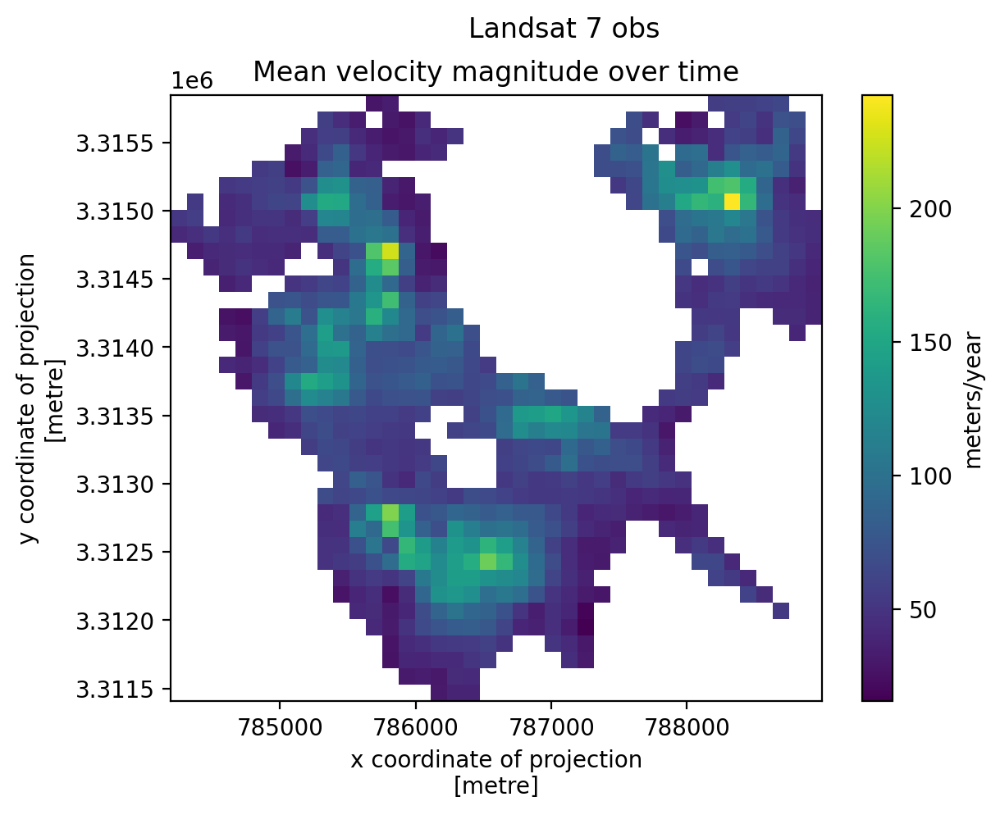

In [76]:
fig, ax = plt.subplots()

l7_mean = np.sqrt(l7_subset.vx.mean(dim='mid_date')**2 + (l7_subset.vy.mean(dim='mid_date')**2))
a = l7_mean.plot(ax=ax)
a.colorbar.set_label('meters/year')
fig.suptitle('Landsat 7 obs')
ax.set_title('Mean velocity magnitude over time');

Let's look at Sentinel 1 data. Note here we are selecting for 2 values instead of 1 using [DataArray.isin](https://xarray.pydata.org/en/stable/generated/xarray.DataArray.isin.html)

In [77]:
s1_condition = sample_glacier_raster.satellite_img1.isin(['1A','1B'])
s1_subset = sample_glacier_raster.sel(mid_date = s1_condition)
s1_subset

<xarray.Dataset>
Dimensions:                     (mid_date: 167, y: 37, x: 40)
Coordinates:
  * mid_date                    (mid_date) datetime64[ns] 2018-12-30T11:41:57...
  * x                           (x) float64 7.843e+05 7.844e+05 ... 7.889e+05
  * y                           (y) float64 3.316e+06 3.316e+06 ... 3.311e+06
    mapping                     int64 0
Data variables: (12/59)
    M11                         (mid_date, y, x) float32 nan nan nan ... nan nan
    M11_dr_to_vr_factor         (mid_date) float32 nan nan nan ... nan nan nan
    M12                         (mid_date, y, x) float32 nan nan nan ... nan nan
    M12_dr_to_vr_factor         (mid_date) float32 nan nan nan ... nan nan nan
    acquisition_date_img1       (mid_date) datetime64[ns] 2018-12-24T11:41:58...
    acquisition_date_img2       (mid_date) datetime64[ns] 2019-01-05T11:41:57...
    ...                          ...
    vy_error_modeled            (mid_date) float32 53.7 53.7 53.7 ... 53.7 53.7
    vy_error_slow               (mid_date) float32 55.8 48.2 77.2 ... 63.3 54.9
    vy_error_stationary         (mid_date) float32 55.8 48.2 77.2 ... 63.3 54.9
    vy_stable_shift             (mid_date) float32 0.0 -0.5 0.0 ... 0.5 -0.2 0.0
    vy_stable_shift_slow        (mid_date) float32 0.0 -0.5 0.0 ... 0.5 -0.2 0.0
    vy_stable_shift_stationary  (mid_date) float32 0.0 -0.5 0.0 ... 0.5 -0.2 0.0
Attributes: (12/19)
    Conventions:                CF-1.8
    GDAL_AREA_OR_POINT:         Area
    author:                     ITS_LIVE, a NASA MEaSUREs project (its-live.j...
    autoRIFT_parameter_file:    http://its-live-data.s3.amazonaws.com/autorif...
    datacube_software_version:  1.0
    date_created:               25-Sep-2023 22:00:23
    ...                         ...
    s3:                         s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    skipped_granules:           s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    time_standard_img1:         UTC
    time_standard_img2:         UTC
    title:                      ITS_LIVE datacube of image pair velocities
    url:                        https://its-live-data.s3.amazonaws.com/datacu...

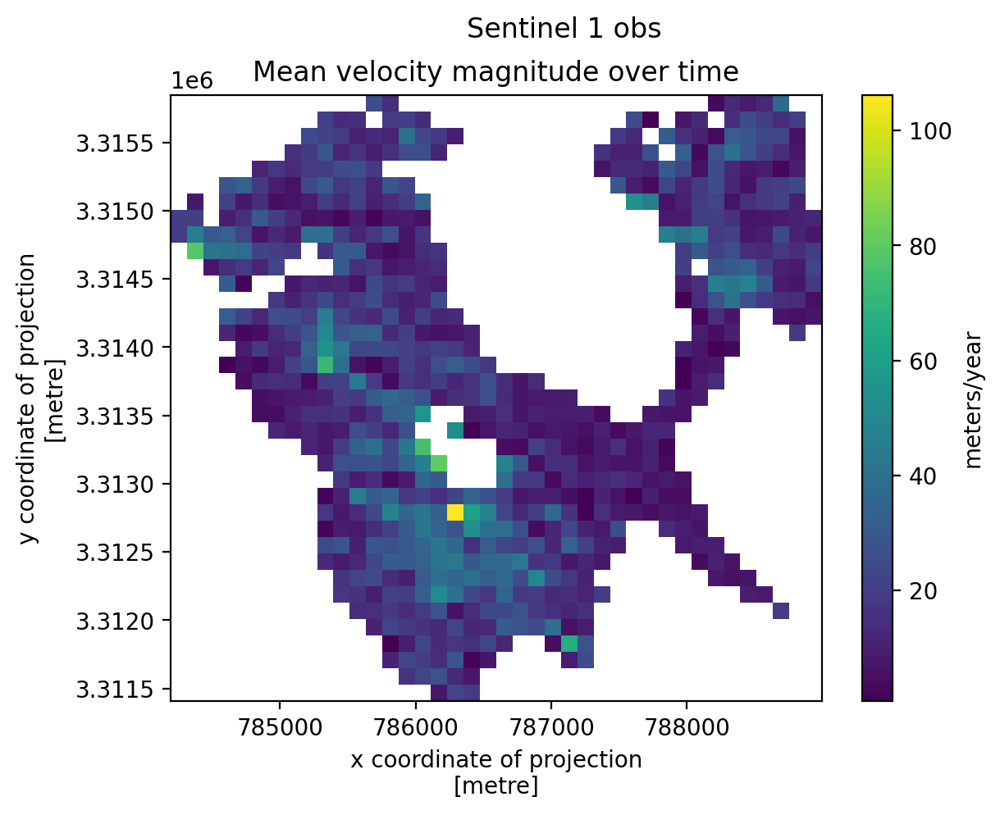

In [78]:
fig, ax = plt.subplots()
s1_mean = np.sqrt(s1_subset.vx.mean(dim='mid_date')**2 + (s1_subset.vy.mean(dim='mid_date')**2))
a = s1_mean.plot(ax=ax)
a.colorbar.set_label('meters/year')
fig.suptitle('Sentinel 1 obs')
ax.set_title('Mean velocity magnitude over time');

In [79]:
s2_condition = sample_glacier_raster.satellite_img1.isin(['2A','2B'])
s2_subset = sample_glacier_raster.sel(mid_date=s2_condition)
s2_subset

<xarray.Dataset>
Dimensions:                     (mid_date: 2342, y: 37, x: 40)
Coordinates:
  * mid_date                    (mid_date) datetime64[ns] 2018-04-14T04:18:49...
  * x                           (x) float64 7.843e+05 7.844e+05 ... 7.889e+05
  * y                           (y) float64 3.316e+06 3.316e+06 ... 3.311e+06
    mapping                     int64 0
Data variables: (12/59)
    M11                         (mid_date, y, x) float32 nan nan nan ... nan nan
    M11_dr_to_vr_factor         (mid_date) float32 nan nan nan ... nan nan nan
    M12                         (mid_date, y, x) float32 nan nan nan ... nan nan
    M12_dr_to_vr_factor         (mid_date) float32 nan nan nan ... nan nan nan
    acquisition_date_img1       (mid_date) datetime64[ns] 2017-12-20T04:21:49...
    acquisition_date_img2       (mid_date) datetime64[ns] 2018-08-07T04:15:49...
    ...                          ...
    vy_error_modeled            (mid_date) float32 40.5 28.6 27.4 ... 60.0 30.0
    vy_error_slow               (mid_date) float32 8.0 1.7 1.2 ... 0.9 12.9 3.6
    vy_error_stationary         (mid_date) float32 8.0 1.7 1.2 ... 0.9 12.9 3.6
    vy_stable_shift             (mid_date) float32 8.9 -4.9 -0.7 ... 8.4 2.9
    vy_stable_shift_slow        (mid_date) float32 8.9 -4.9 -0.7 ... 8.4 2.9
    vy_stable_shift_stationary  (mid_date) float32 8.9 -4.9 -0.7 ... 8.4 2.9
Attributes: (12/19)
    Conventions:                CF-1.8
    GDAL_AREA_OR_POINT:         Area
    author:                     ITS_LIVE, a NASA MEaSUREs project (its-live.j...
    autoRIFT_parameter_file:    http://its-live-data.s3.amazonaws.com/autorif...
    datacube_software_version:  1.0
    date_created:               25-Sep-2023 22:00:23
    ...                         ...
    s3:                         s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    skipped_granules:           s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    time_standard_img1:         UTC
    time_standard_img2:         UTC
    title:                      ITS_LIVE datacube of image pair velocities
    url:                        https://its-live-data.s3.amazonaws.com/datacu...

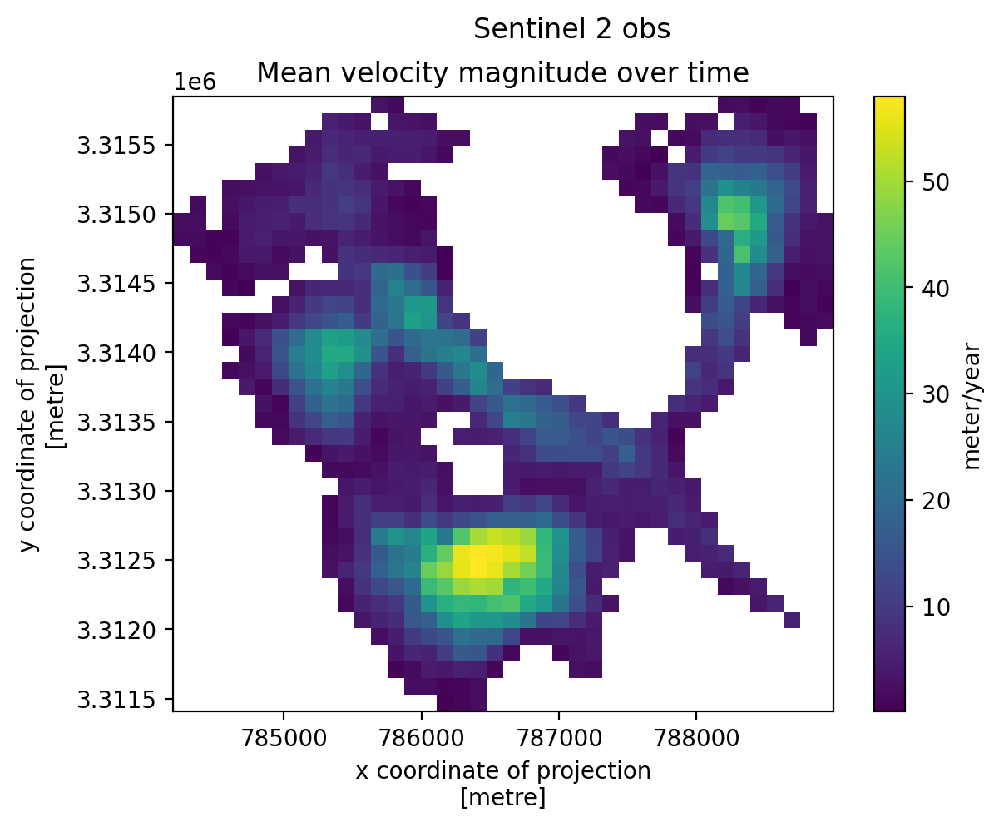

In [80]:
fig, ax = plt.subplots()
s2_mean = np.sqrt(s2_subset.vx.mean(dim='mid_date')**2 + (s2_subset.vy.mean(dim='mid_date')**2))
a = s2_mean.plot(ax=ax)
a.colorbar.set_label('meter/year')
fig.suptitle('Sentinel 2 obs')
ax.set_title('Mean velocity magnitude over time');

### Combine the temporal mean velocities for each sensor into one object

The plots that we just constructed for each sensor are informative but not great for comparing velocity measurements calculated from each sensor because the colorscales aren't constant across each sensor. Let's create a new object that contains the mean magnitude of velocity over time for each sensor and plot them so that they're easier to compare.

First, we'll use [`expand_dims()`](https://docs.xarray.dev/en/stable/generated/xarray.Dataset.expand_dims.html) to add a 'sensor' dimension to each dataset and name it appropriately:

In [81]:
l8_mean = l8_mean.expand_dims({'sensor':['L8']})
l7_mean = l7_mean.expand_dims({'sensor':['L7']})
s1_mean = s1_mean.expand_dims({'sensor':['S1']})
s2_mean = s2_mean.expand_dims({'sensor':['S2']})

Next, we want to combine all of these objects together. Xarray has a number of methods for combining data that you can read about [here](https://docs.xarray.dev/en/stable/user-guide/combining.html). Because we want to combine the objects along the `sensor` dimension, [`xr.concat()`](https://docs.xarray.dev/en/stable/generated/xarray.concat.html) is the most appropriate method:  

In [82]:
all_sensors = xr.concat([l8_mean, 
                       l7_mean,
                       s1_mean,
                       s2_mean], dim='sensor')

In [83]:
all_sensors.sensor

<xarray.DataArray 'sensor' (sensor: 4)>
array(['L8', 'L7', 'S1', 'S2'], dtype=object)
Coordinates:
  * sensor   (sensor) object 'L8' 'L7' 'S1' 'S2'
    mapping  int64 0

Now we can visualize the temporal averages for each sensor. Note that we use different syntax to specify the colorbar label in this example. Because we are creating a `FacetGrid` plot object, we don't use `ax` objects. Instead we pass the `cbar_kwargs` dict object: 

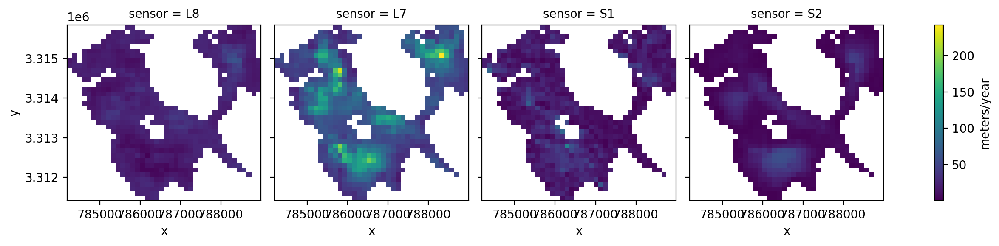

In [84]:
a = all_sensors.plot(col='sensor', cbar_kwargs={'label':'meters/year'});

ITS_LIVE is exciting because it combines velocity data from a number of satellites into one accessible and efficient dataset. From this brief look, you can see snapshot overviews of the different data within the dataset and begin to think about processing steps you might take to work with the data further.

### Checking coverage along a dimension
It would be nice to be able to scan/visualize and observe coverage of a variable along a dimension

First need to make a mask that will tell us all the possible 'valid' pixels. ie pixels over ice v. rock.

In [85]:
valid_pixels = sample_glacier_raster.v.count(dim=['x','y'])
valid_pix_max = sample_glacier_raster.v.notnull().any('mid_date').sum(['x','y'])

sample_glacier_raster['cov'] = valid_pixels/valid_pix_max



In [86]:
#how many time steps are duplicates?, there are 16872 unique vals in mid_dates
np.unique(sample_glacier_raster['mid_date'].data).shape

(3018,)

Start by grouping over `mid_date`. Would expect 3,018 (# unique time steps) with mostly groups of 1, groups of more than one on duplicate coords

In [87]:
test_gb = sample_glacier_raster.groupby(sample_glacier_raster.mid_date)
type(test_gb.groups)

dict

`test_gb.groups` is a [dict](https://xarray.pydata.org/en/stable/generated/xarray.core.groupby.DatasetGroupBy.groups.html), so let's explore that object. The keys correspond to `mid_date` coordinates (see this for yourself by running `test_gb.groups.keys()`), so the values should be the entries at that coordinate.

### Visualize data coverage over time series

Let's take a look at the data coverage over this glacier across the time series:

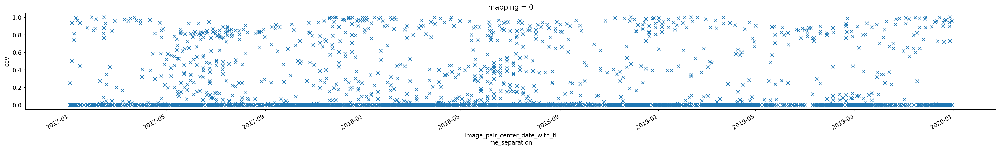

In [88]:
fig, ax = plt.subplots(figsize=(30,3))
sample_glacier_raster.cov.plot(ax=ax, linestyle='None',marker = 'x')

But what if we wanted to explore the relative coverage of the different sensors that make up the its_live dataset as a whole?
We can use `groupby` to group the data based on a single condition such as `satellite_img1` or `mid_date`.

In [89]:
sample_glacier_raster.cov.groupby(sample_glacier_raster.satellite_img1)

DataArrayGroupBy, grouped over 'satellite_img1'
5 groups with labels '1A', '2A', '2B', '7', '8'.

In [90]:
sample_glacier_raster.groupby('mid_date')

DatasetGroupBy, grouped over 'mid_date'
3018 groups with labels 2017-01-01T16:15:50.6605240....

However, if we want to examine the coverage of data from different sensor groups over time, we would essentially want to `groupby` two groups. To do this, we use [flox](https://flox.readthedocs.io/en/latest/)

In [91]:
import flox.xarray

This is the `xr.DataArray` on which we will perform the grouping operation using `flox`

In [92]:
sample_glacier_raster.cov

<xarray.DataArray 'cov' (mid_date: 3974)>
array([0.35219236, 0.        , 0.        , ..., 0.        , 0.        ,
       0.        ])
Coordinates:
  * mid_date  (mid_date) datetime64[ns] 2018-04-14T04:18:49.171219968 ... 201...
    mapping   int64 0

Using `flox`, we will define a coverage object that takes as inputs the data we want to reduce, the groups we want to use to group the data and the reduction we want to perform. 

In [93]:
coverage = flox.xarray.xarray_reduce(
    # array to reduce
    sample_glacier_raster.cov,
    # Grouping by two variables
    sample_glacier_raster.satellite_img1.compute(),
    sample_glacier_raster.mid_date,
    # reduction to apply in each group
    func="mean",
    # for when no elements exist in a group
    fill_value=0,
)

Now we can visualize the coverage over time for each sensor in the its_live dataset. Cool!

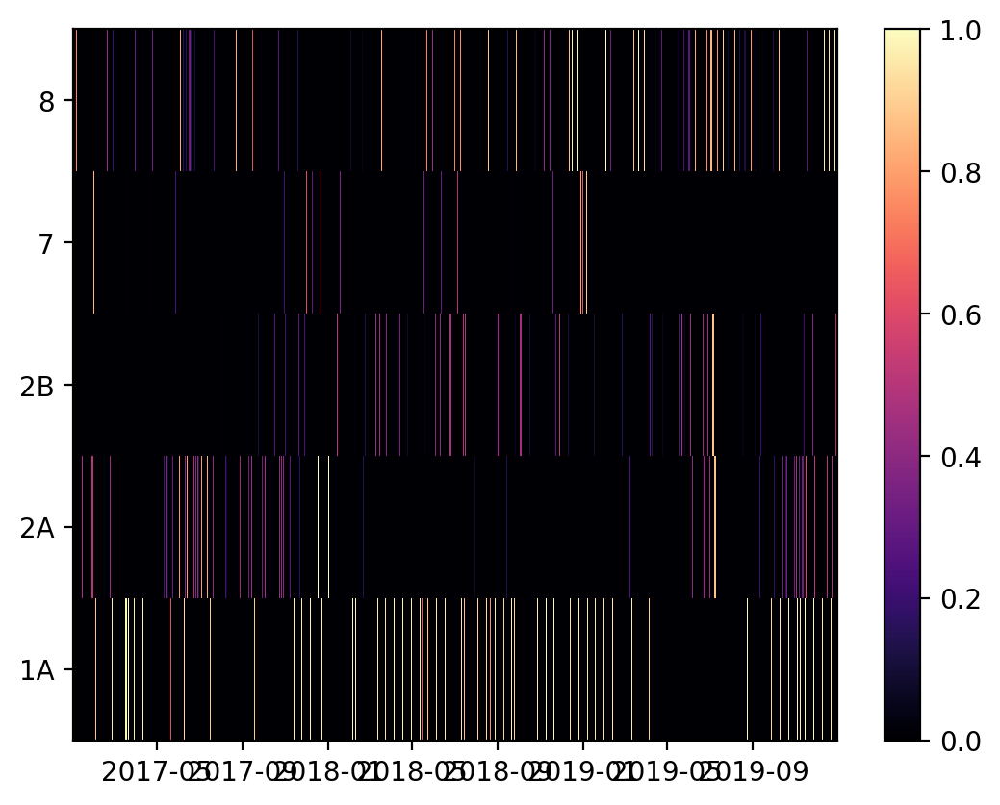

In [94]:
plt.pcolormesh(coverage.mid_date, coverage.satellite_img1, coverage, cmap='magma')
plt.colorbar();

### Conclusion 
This notebook displayed basic data inspection steps that you can take when working with a new dataset. The following notebooks will demonstrate further processing, analytical and visualization steps you can take. We will be working with the same object in the following notebook, so we can use cell magic to store the object and read it in in the next notebook, rather than making it all over again. You can read more about the magic command [here](https://ipython.readthedocs.io/en/stable/config/extensions/storemagic.html).

In [95]:
%store sample_glacier_raster

Stored 'sample_glacier_raster' (Dataset)
